# **Загрузка Библиотек и Данных**

In [ ]:
!pip install shap
!pip install interpret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 19.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.2/45.2 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.6/16.6 MB 45.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 41.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 43.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 40.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.1/780.1 kB 20.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 40.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.7/264.7 kB 18.4 MB/s eta 0:00:00
  Created wheel for dash-cytoscape: filename=dash_cytoscape-1.0.2-py3-none-any.whl size=401

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import csv

In [ ]:
from scipy.stats import ttest_ind, stats, skew, loguniform
from scipy.special import expit

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression, ElasticNet, LogisticRegressionCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import RFE,SelectFromModel
from sklearn.calibration import CalibratedClassifierCV
from sklearn.pipeline import Pipeline
from sklearn.experimental import enable_halving_search_cv

In [ ]:
from imblearn.over_sampling import SMOTE
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
import shap
from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

ValueError: mount failed

Тут данные взяты с личного диска, при необходимости - заменить на локальную загрузку

In [ ]:
combined_df = pd.read_csv('/content/drive/MyDrive/Data/KIM_2024/Данные_Почищенные/for_analysis_merged.csv')
observation_merged_df = pd.read_csv('/content/drive/MyDrive/Data/KIM_2024/Данные_Почищенные/observation_merged.csv')
comparison_merged_df = pd.read_csv (('/content/drive/MyDrive/Data/KIM_2024/Данные_Почищенные/comparison_merged.csv'))

## **Прогнозирование**

0.0 - отсутствие заболевания или контрольную группу.

1.0 - наличие заболевания или экспериментальную группу.

In [ ]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 30 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Gender                        180 non-null    int64  
 1   Age                           180 non-null    int64  
 2   Body Fat (%)                  180 non-null    float64
 3   Visceral Fat (%)              180 non-null    int64  
 4   Skeleton (%)                  180 non-null    float64
 5   Bone Mass (kg)                180 non-null    float64
 6   Water (%)                     180 non-null    float64
 7   Basal Metabolic Rate (kcal)   180 non-null    int64  
 8   Chest Circumference (cm)      180 non-null    int64  
 9   Waist Circumference (cm)      180 non-null    int64  
 10  Abdominal Circumference (cm)  180 non-null    int64  
 11  Hip Circumference (cm)        180 non-null    float64
 12  BMI                           180 non-null    float64
 13  ALT  

In [ ]:
combined_df.describe()[1:].T

,mean,std,min,25%,50%,75%,max
Gender,0.533333,0.500279,0.00,0.0000,1.000,1.0000,1.00
Age,43.094444,9.717057,25.00,36.0000,43.000,50.0000,60.00
Body Fat (%),33.636111,5.912847,17.70,29.8000,34.200,37.9000,47.40
Visceral Fat (%),13.466667,4.208796,5.00,11.0000,13.000,16.0000,26.00
Skeleton (%),35.883889,4.182194,27.10,32.8000,36.150,38.9500,48.70
Bone Mass (kg),3.051111,0.621000,2.00,2.6000,2.900,3.5000,4.70
Water (%),46.559444,4.706369,30.70,43.5000,46.400,49.2250,61.40
Basal Metabolic Rate (kcal),1616.000000,258.080733,1179.00,1382.7500,1596.500,1835.5000,2156.00
Chest Circumference (cm),108.944444,9.925827,89.00,101.0000,108.500,117.2500,132.00
Waist Circumference (cm),98.938889,11.140627,76.00,92.0000,97.500,106.0000,134.00


In [ ]:
rename_dict = {
    'Gender': 'Пол',
    'Age': 'Возраст',
    'Body Fat (%)': 'О.ж.,%',
    'Visceral Fat (%)': 'Висц.ж,%',
    'Skeleton (%)': 'Мыш.м,%',
    'Bone Mass (kg)': 'Кости,кг',
    'Water (%)': 'Вода,%',
    'Basal Metabolic Rate (kcal)': 'СООВ,ккал',
    'Chest Circumference (cm)': 'ОГ,см',
    'Waist Circumference (cm)': 'ОТ,см',
    'Abdominal Circumference (cm)': 'ОЖ,см',
    'Hip Circumference (cm)': 'ОБ,см',
    'BMI': 'ИМТ',
    'ALT': 'АЛТ',
    'AST': 'АСТ',
    'GGT': 'ГГТП',
    'ALP': 'ЩФ',
    'Total Cholesterol': 'ХСобщ.',
    'LDL': 'ЛПНП',
    'HDL': 'ЛПВП',
    'Triglycerides': 'Триглиц.',
    'Total Bilirubin': 'Билир.о',
    'Direct Bilirubin': 'Билир.пр',
    'Glucose': 'Глюкоза',
    'Insulin': 'Инсулин',
    'Ferritin': 'Ферритин',
    'CRP': 'СРБ',
    'Total Protein': 'О.белок',
    'Uric Acid': 'Моч.к-та',
    'Group': 'Болен'
}
combined_df = combined_df.rename(columns=rename_dict)

In [ ]:
combined_df.columns

Index(['Пол', 'Возраст', 'О.ж.,%', 'Висц.ж,%', 'Мыш.м,%', 'Кости,кг', 'Вода,%',
       'СООВ,ккал', 'ОГ,см', 'ОТ,см', 'ОЖ,см', 'ОБ,см', 'ИМТ', 'АЛТ', 'АСТ',
       'ГГТП', 'ЩФ', 'ХСобщ.', 'ЛПНП', 'ЛПВП', 'Триглиц.', 'Билир.о',
       'Билир.пр', 'Глюкоза', 'Инсулин', 'Ферритин', 'СРБ', 'О.белок',
       'Моч.к-та', 'Болен'],
      dtype='object')

In [ ]:
combined_df.select_dtypes(include=[np.number]).apply(skew).sort_values(ascending=False)

,0
Билир.пр,1.695210
ГГТП,1.599581
Ферритин,1.437187
АСТ,1.430645
Билир.о,1.421611
СРБ,1.421082
Триглиц.,1.215293
ЩФ,1.036821
АЛТ,0.884080
Инсулин,0.857859


In [ ]:
#combined_df = combined_df.drop(columns=['ФИО'])
#combined_df = combined_df.drop(columns=['Рост,см'])
#combined_df = combined_df.drop(columns=['Вес,кг'])
# combined_df = combined_df.drop(columns=['Мыш.м,%'])

if 'Пол' in combined_df.columns:
    combined_df['Пол'] = combined_df['Пол'].replace({'жен': 1, 'муж': 0})

In [ ]:
combined_df.rename(columns={'Болен': 'Group'}, inplace=True)

In [ ]:
# Конвертация триглицеридов из ммоль/л в mg/dL
combined_df['Триглиц.'] = combined_df['Триглиц.'] * 88.57

# Применение лог-преобразования к правоскошенным признакам
highly_skewed_columns = ['Билир.пр', 'ГГТП', 'Ферритин', 'АСТ', 'Билир.о', 'СРБ', 'Триглиц.', 'ЩФ']
epsilon = 1e-3
for col in highly_skewed_columns:
    combined_df[col] = np.log(combined_df[col] + epsilon)


### Correlation

In [ ]:
# Вычисление матрицы корреляции
correlation_matrix = combined_df.corr().abs()

# Установление порога корреляции
correlation_threshold = 0.55

# Выбор признаков, которые превышают порог корреляции
highly_correlated_features = np.where(correlation_matrix >= correlation_threshold)
highly_correlated_features = [(correlation_matrix.columns[x], correlation_matrix.columns[y]) for x, y in zip(*highly_correlated_features) if x != y and x < y]


In [ ]:
print("Highly correlated features:")
# for feature_pair in highly_correlated_features:
#     print(feature_pair)

Highly correlated features:


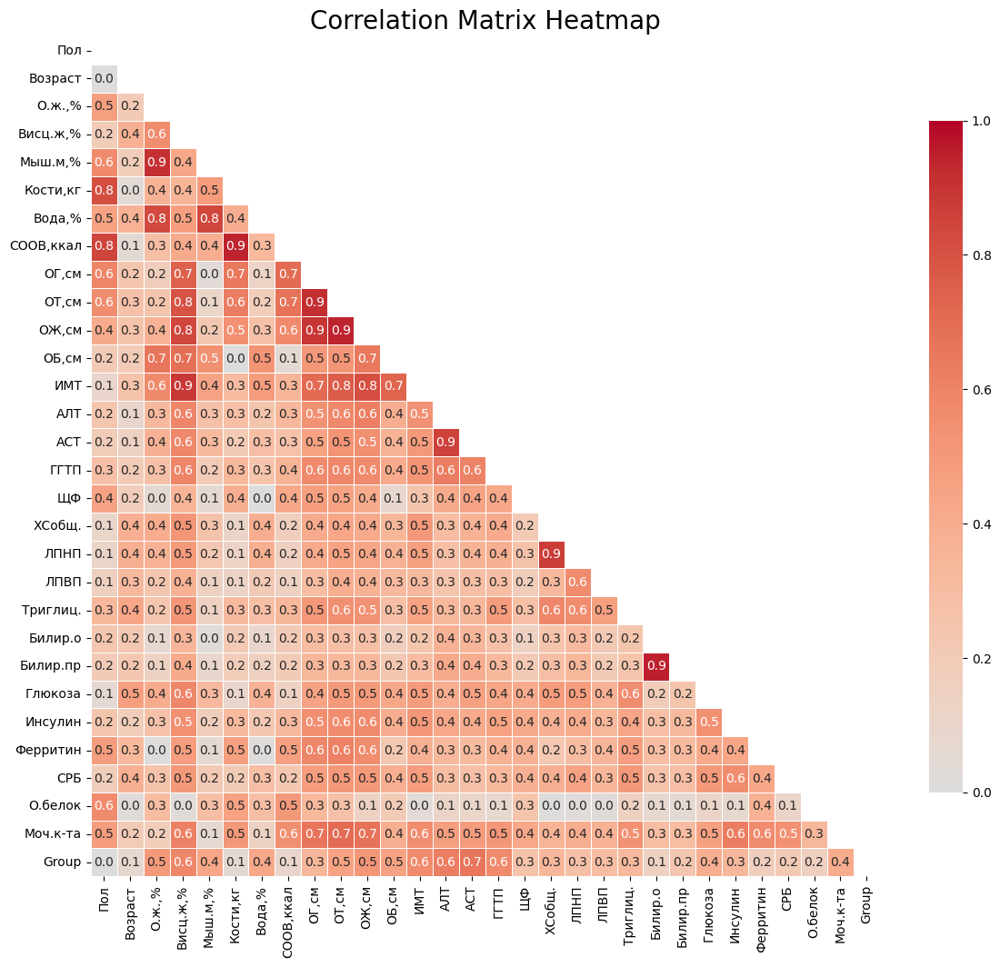

In [ ]:
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

plt.figure(figsize=(14, 12))
heatmap = sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', center=0, fmt='.1f',
                      linewidths=0.5, vmin=0, vmax=1, mask=mask,
                      cbar_kws={"shrink": .8})
plt.title('Correlation Matrix Heatmap', size=20)
plt.xticks(size=10)
plt.yticks(size=10)

plt.show()

## Распределение

In [ ]:
combined_df.columns

Index(['Пол', 'Возраст', 'О.ж.,%', 'Висц.ж,%', 'Мыш.м,%', 'Кости,кг', 'Вода,%',
       'СООВ,ккал', 'ОГ,см', 'ОТ,см', 'ОЖ,см', 'ОБ,см', 'ИМТ', 'АЛТ', 'АСТ',
       'ГГТП', 'ЩФ', 'ХСобщ.', 'ЛПНП', 'ЛПВП', 'Триглиц.', 'Билир.о',
       'Билир.пр', 'Глюкоза', 'Инсулин', 'Ферритин', 'СРБ', 'О.белок',
       'Моч.к-та', 'Group'],
      dtype='object')

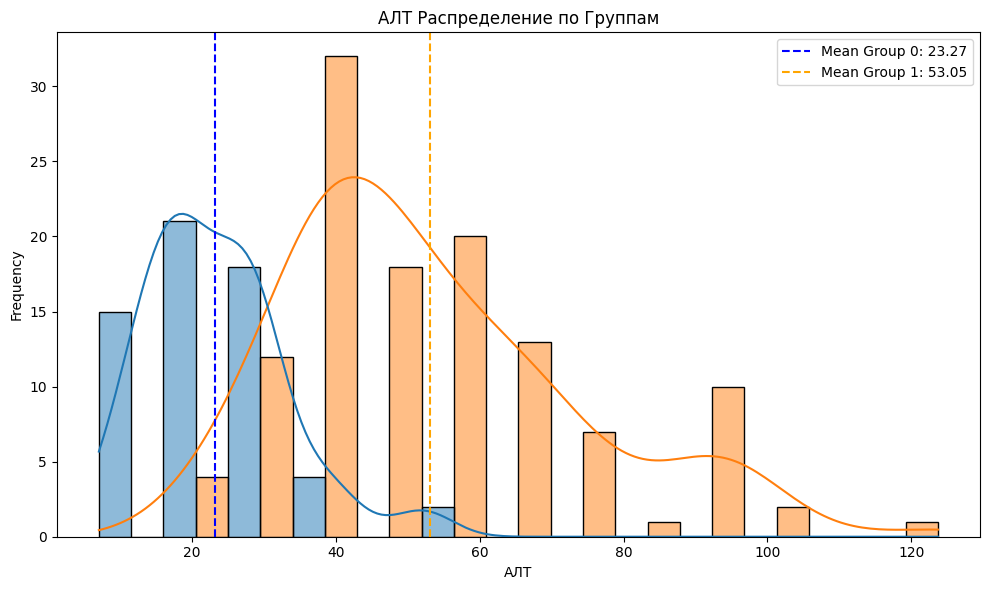

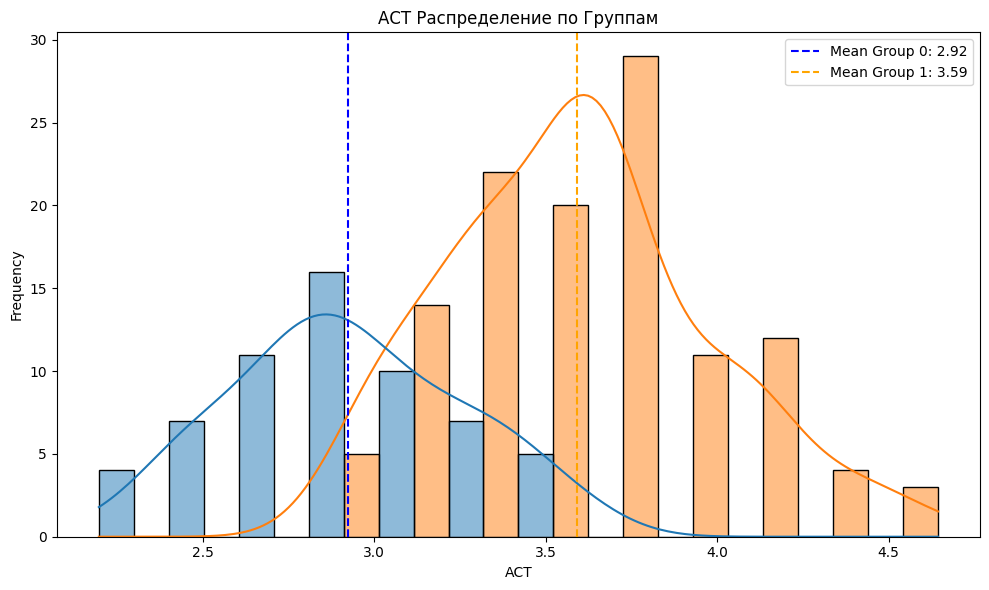

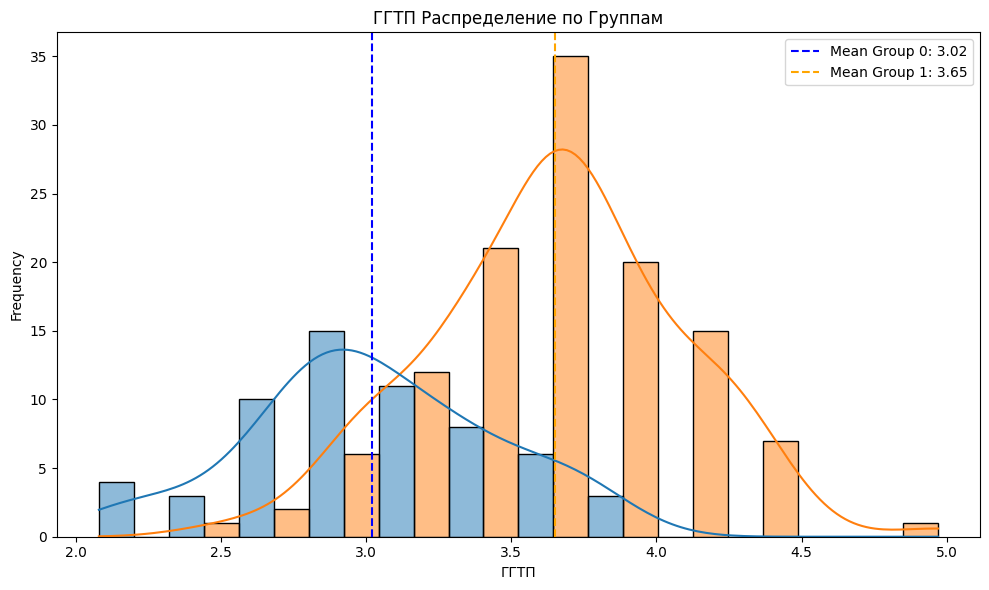

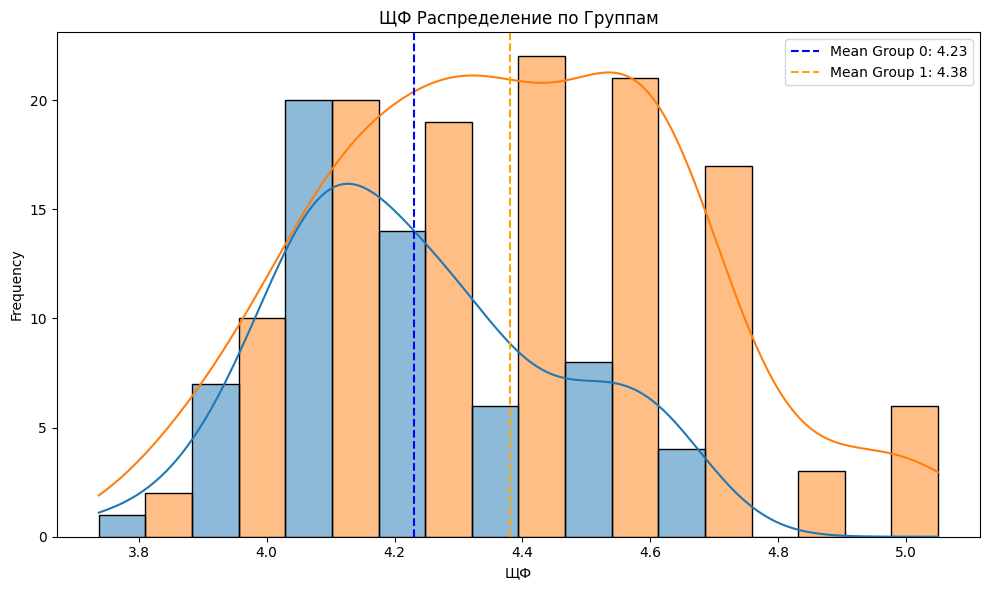

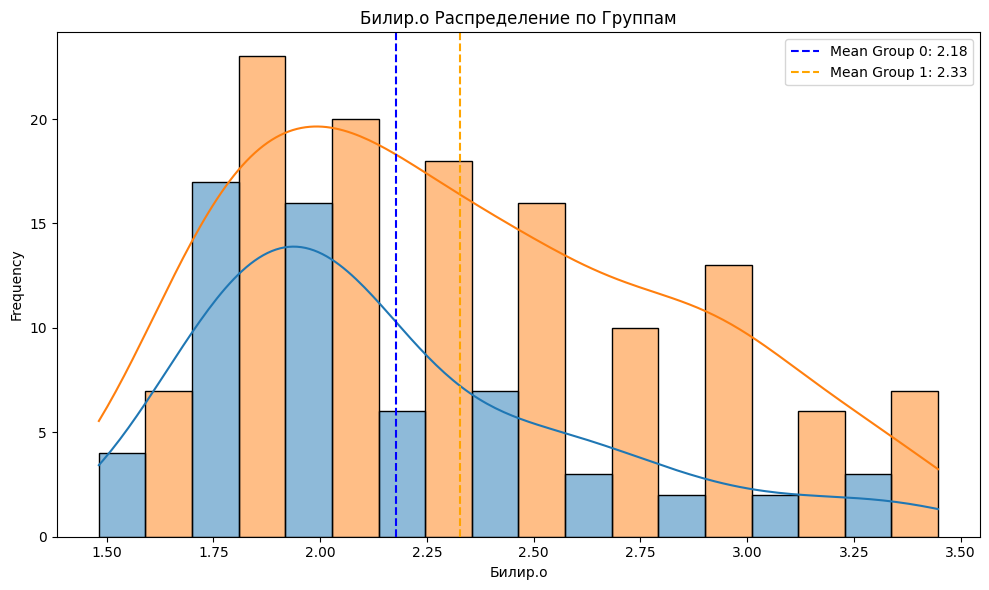

...

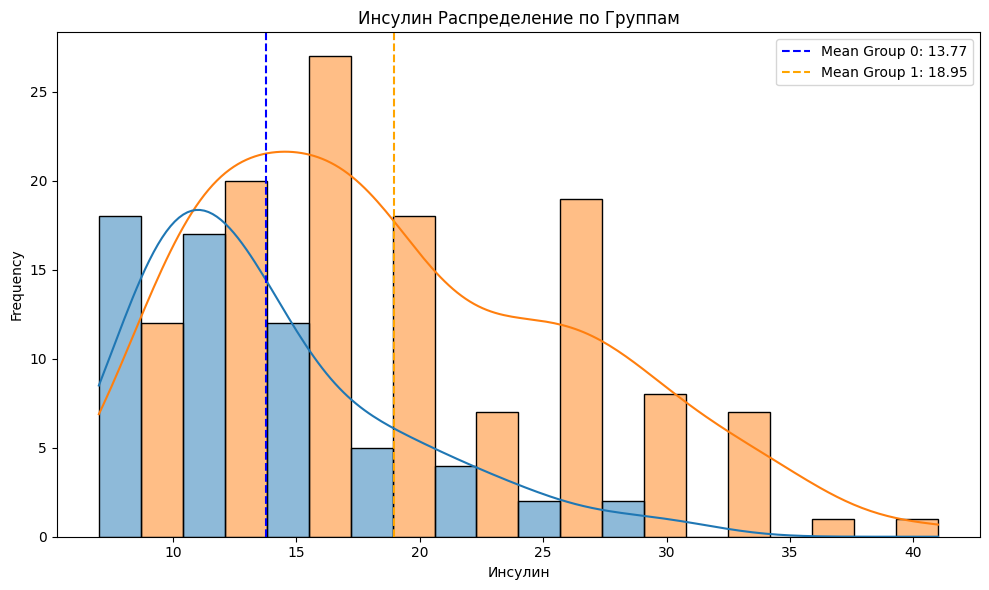

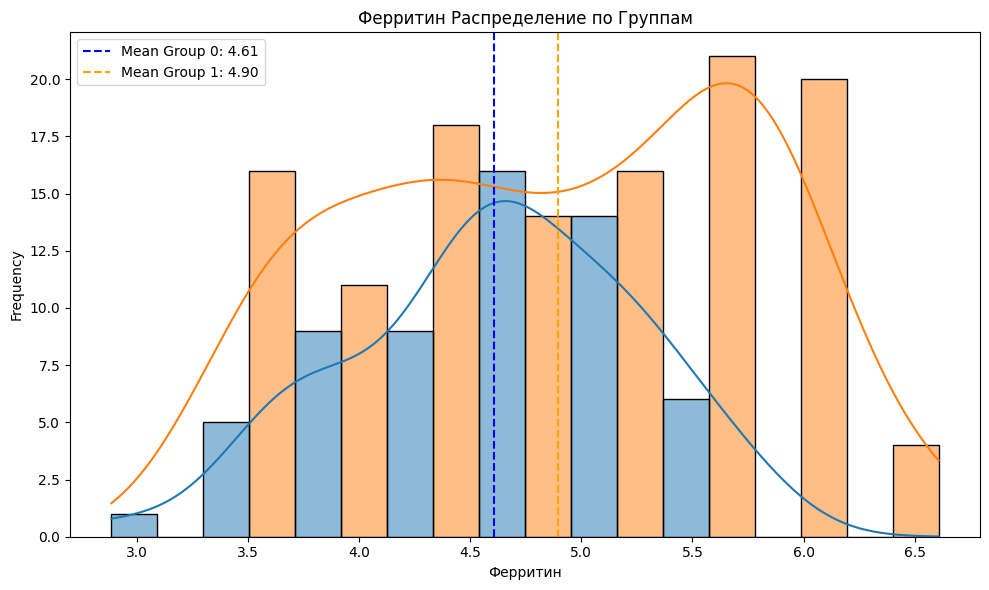

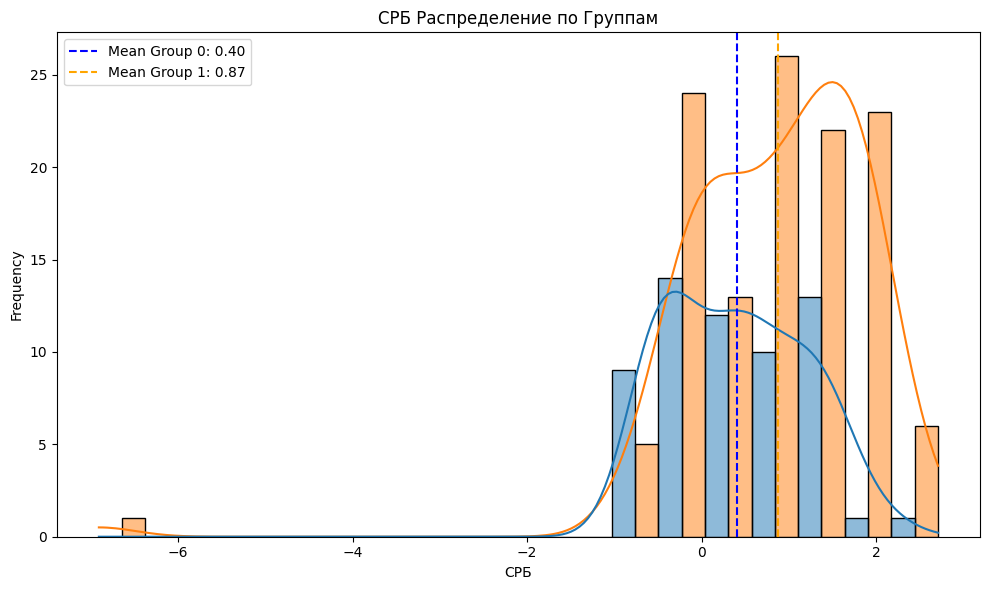

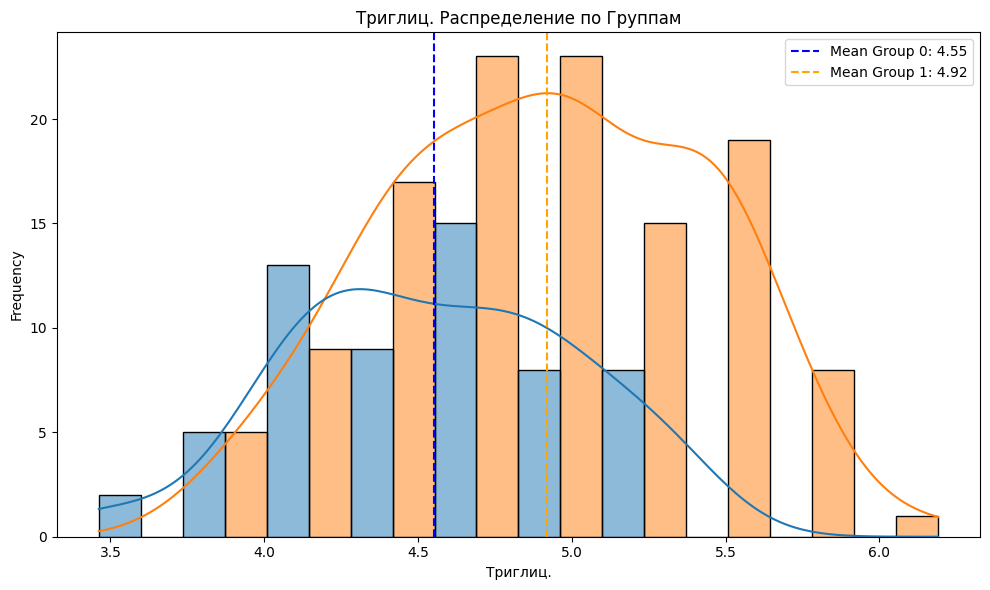

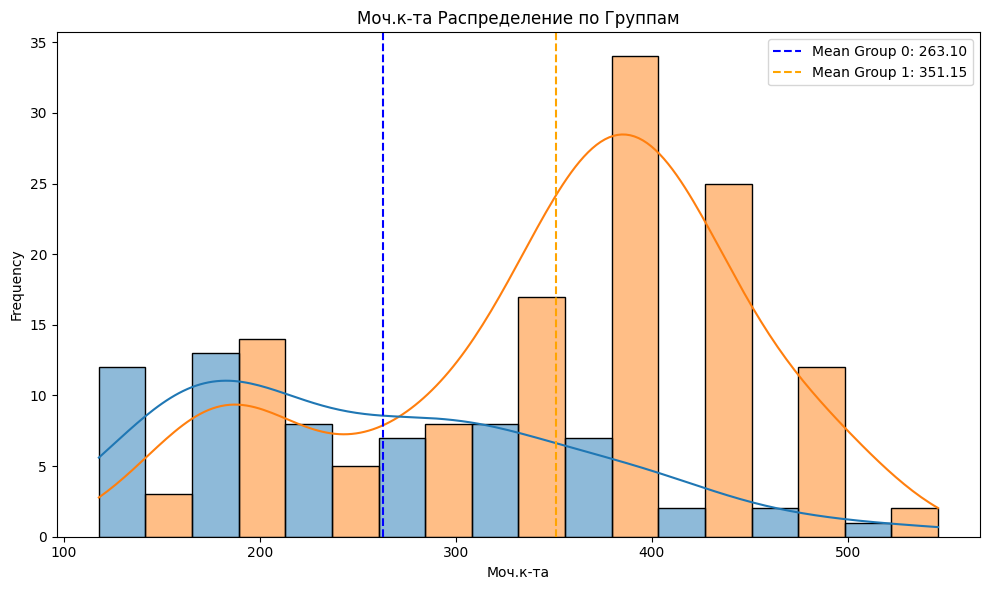

In [ ]:
features_to_plot = [
    'АЛТ', 'АСТ', 'ГГТП', 'ЩФ', 'Билир.о', 'Билир.пр', 'О.белок',
    'Глюкоза', 'Инсулин', 'Ферритин', 'СРБ', 'Триглиц.', 'Моч.к-та'
]

for feature in features_to_plot:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=combined_df, x=feature, hue="Group", multiple="dodge", kde=True)
    mean_group_0 = combined_df[combined_df['Group'] == 0][feature].mean()
    mean_group_1 = combined_df[combined_df['Group'] == 1][feature].mean()
    plt.axvline(mean_group_0, color='blue', linestyle='--', label=f'Mean Group 0: {mean_group_0:.2f}')
    plt.axvline(mean_group_1, color='orange', linestyle='--', label=f'Mean Group 1: {mean_group_1:.2f}')
    plt.title(f'{feature} Распределение по Группам')
    plt.xlabel(feature)
    plt.ylabel("Frequency")
    plt.legend()
    plt.tight_layout()
    plt.show()


In [ ]:
# combined_df.describe().to_csv('data_sescribed.csv')
combined_df.describe().round(2).T[1:]

,count,mean,std,min,25%,50%,75%,max
Возраст,180.0,43.09,9.72,25.00,36.00,43.00,50.00,60.00
"О.ж.,%",180.0,33.64,5.91,17.70,29.80,34.20,37.90,47.40
"Висц.ж,%",180.0,13.47,4.21,5.00,11.00,13.00,16.00,26.00
"Мыш.м,%",180.0,35.88,4.18,27.10,32.80,36.15,38.95,48.70
"Кости,кг",180.0,3.05,0.62,2.00,2.60,2.90,3.50,4.70
"Вода,%",180.0,46.56,4.71,30.70,43.50,46.40,49.22,61.40
"СООВ,ккал",180.0,1616.00,258.08,1179.00,1382.75,1596.50,1835.50,2156.00
"ОГ,см",180.0,108.94,9.93,89.00,101.00,108.50,117.25,132.00
"ОТ,см",180.0,98.94,11.14,76.00,92.00,97.50,106.00,134.00
"ОЖ,см",180.0,104.66,10.28,84.00,97.00,103.50,112.25,135.00


# **LOG REG with ELASTIC & Lasso**


In [ ]:
combined_df.columns

Index(['Пол', 'Возраст', 'О.ж.,%', 'Висц.ж,%', 'Мыш.м,%', 'Кости,кг', 'Вода,%',
       'СООВ,ккал', 'ОГ,см', 'ОТ,см', 'ОЖ,см', 'ОБ,см', 'ИМТ', 'АЛТ', 'АСТ',
       'ГГТП', 'ЩФ', 'ХСобщ.', 'ЛПНП', 'ЛПВП', 'Триглиц.', 'Билир.о',
       'Билир.пр', 'Глюкоза', 'Инсулин', 'Ферритин', 'СРБ', 'О.белок',
       'Моч.к-та', 'Group'],
      dtype='object')

In [ ]:
features = ['Пол', 'Возраст', 'О.ж.,%', 'Висц.ж,%', 'Кости,кг', 'Вода,%',
       'СООВ,ккал', 'ОГ,см', 'ОТ,см', 'ОЖ,см', 'ОБ,см', 'ИМТ', 'АЛТ', 'АСТ',
       'ГГТП', 'ЩФ', 'ХСобщ.', 'ЛПНП', 'ЛПВП', 'Триглиц.', 'Билир.о',
       'Билир.пр', 'Глюкоза', 'Инсулин', 'Ферритин', 'СРБ', 'О.белок',
       'Моч.к-та',]
target = 'Group'

X = combined_df[features]
y = combined_df[target]

**Сокращение коэффициентов:**<br>
Модель присваивает каждому признаку вес (коэффициент). Если признак вносит большой вклад в прогнозирование целевого значения, его коэффициент будет большим. Если же вклад невелик, его коэффициент будет маленьким.

Штрафы:

- Штраф L1 (часть «Лассо»): добавляет стоимость, зависящую от размера коэффициентов. Если коэффициент признака мал, штраф L1 может снизить его до нуля. Нулевой коэффициент означает, что признак игнорируется или «исключается» из модели, поскольку считается неважным.


- Штраф L2 (часть «Ридж»): уменьшает коэффициенты менее важных признаков, но не обнуляет их.

## **Lasso**

In [ ]:
X = combined_df.drop(columns=['Group'])
y = combined_df['Group']
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Скейлим по train, применяем к test
scaler = StandardScaler()
X_train_s = scaler.fit_transform(X_train)
X_test_s  = scaler.transform(X_test)


log_reg_lasso = LogisticRegression(
    penalty='l1',
    solver='saga',
    C=0.2,
    max_iter=10000,
    random_state=42
)
log_reg_lasso.fit(X_train_s, y_train)

# coef_.shape = (n_classes, n_features). Для бинарного — (1, n_features)
coefs = log_reg_lasso.coef_

# Мелкие псевдонули отсечем
tol = 1e-8
mask = (np.abs(coefs) > tol).any(axis=0)
selected_features = X.columns[mask]

print("Selected Features:", list(selected_features))

print("Train accuracy:", log_reg_lasso.score(X_train_s, y_train))
print("Test  accuracy:", log_reg_lasso.score(X_test_s,  y_test))


Selected Features: ['О.ж.,%', 'Висц.ж,%', 'Мыш.м,%', 'Вода,%', 'ИМТ', 'АЛТ', 'АСТ', 'ГГТП']
Train accuracy: 0.9236111111111112
Test  accuracy: 0.9444444444444444


Lasso Logistic Regression Test Accuracy: 0.6667
Confusion Matrix on Test Data:
[[ 0 12]
 [ 0 24]]


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  warnings.warn(


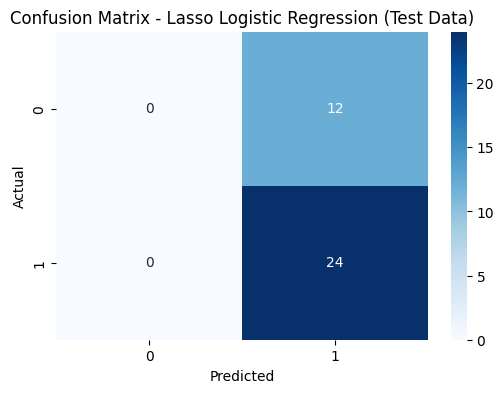


Classification Report on Test Data:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.67      1.00      0.80        24

    accuracy                           0.67        36
   macro avg       0.33      0.50      0.40        36
weighted avg       0.44      0.67      0.53        36



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
y_test_pred_class = log_reg_lasso.predict(X_test)
y_test_pred_proba = log_reg_lasso.predict_proba(X_test)[:, 1]

cm_test = confusion_matrix(y_test, y_test_pred_class)
test_accuracy = accuracy_score(y_test, y_test_pred_class)

print(f"Lasso Logistic Regression Test Accuracy: {test_accuracy:.4f}")
print("Confusion Matrix on Test Data:")
print(cm_test)

plt.figure(figsize=(6, 4))
sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix - Lasso Logistic Regression (Test Data)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

print("\nClassification Report on Test Data:")
print(classification_report(y_test, y_test_pred_class))

In [ ]:
unscaled_coefficients = log_reg_lasso.coef_[0] / scaler.scale_
unscaled_intercept = log_reg_lasso.intercept_ - np.sum((scaler.mean_ / scaler.scale_) * log_reg_lasso.coef_[0])
unscaled_coefficients_series = pd.Series(unscaled_coefficients, index=X.columns)
non_zero_coefficients = unscaled_coefficients_series[unscaled_coefficients_series != 0]
print("Non-Zero Unscaled Coefficients:")
print(non_zero_coefficients)

print("Unscaled Intercept:", unscaled_intercept)

Non-Zero Unscaled Coefficients:
О.ж.,%      0.058343
Висц.ж,%    0.121595
Мыш.м,%    -0.052995
Вода,%     -0.002519
ИМТ         0.059418
АЛТ         0.057816
АСТ         1.390126
ГГТП        0.498456
dtype: float64
Unscaled Intercept: [-10.71363289]


In [ ]:
def predict_with_unscaled(features):
    y_pred = unscaled_intercept.item()
    for feature, coef in zip(X.columns, unscaled_coefficients):
        y_pred += coef * features[feature]
    return y_pred

raw_predictions = combined_df.apply(predict_with_unscaled, axis=1)

predicted_probabilities = 1 / (1 + np.exp(-raw_predictions.to_numpy().flatten()))

predicted_classes = (predicted_probabilities >= 0.5).astype(int)

results_df = pd.DataFrame({
    'raw_prediction': raw_predictions,
    'predicted_probability': predicted_probabilities,
    'predicted_class': predicted_classes,
    'actual_class': combined_df['Group']
})

print(results_df.head())

cm = confusion_matrix(results_df['actual_class'], results_df['predicted_class'])
print("Confusion Matrix:")
print(cm)

accuracy = accuracy_score(results_df['actual_class'], results_df['predicted_class'])
print(f"Accuracy: {accuracy:.4f}")

report = classification_report(results_df['actual_class'], results_df['predicted_class'])
print("Classification Report:")
print(report)

   raw_prediction  predicted_probability  predicted_class  actual_class
0        1.633895               0.836703                1             1
1        0.653751               0.657855                1             1
2        4.210669               0.985380                1             1
3        1.630133               0.836188                1             1
4        6.403658               0.998347                1             1
Confusion Matrix:
[[ 51   9]
 [  4 116]]
Accuracy: 0.9278
Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.85      0.89        60
           1       0.93      0.97      0.95       120

    accuracy                           0.93       180
   macro avg       0.93      0.91      0.92       180
weighted avg       0.93      0.93      0.93       180



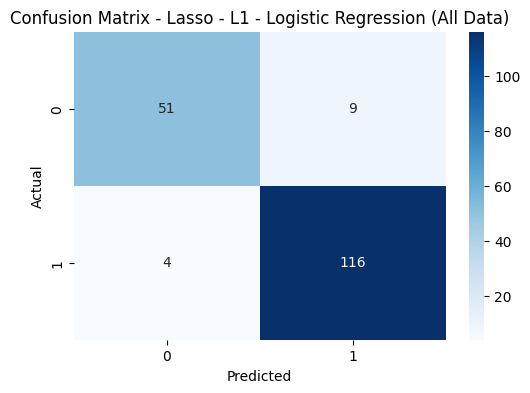

In [ ]:
cm = confusion_matrix(results_df['actual_class'], results_df['predicted_class'])
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix - Lasso - L1 - Logistic Regression (All Data)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

## **Pipeline**

In [ ]:
X = combined_df.drop(columns=['Group'])
y = combined_df['Group']

X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

pipe_lasso = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', LogisticRegressionCV(
        Cs=np.logspace(-2, 2, 50),
        cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
        penalty='l1', solver='saga', scoring='roc_auc',
        max_iter=10000, n_jobs=-1
    ))
])

pipe_lasso.fit(X_tr, y_tr)
proba_te = pipe_lasso.predict_proba(X_te)[:, 1]
y_pred = (proba_te >= 0.5).astype(int)

print(confusion_matrix(y_te, y_pred))
print(classification_report(y_te, y_pred, digits=3))
print("ROC-AUC:", roc_auc_score(y_te, proba_te))


[[11  1]
 [ 0 24]]
              precision    recall  f1-score   support

           0      1.000     0.917     0.957        12
           1      0.960     1.000     0.980        24

    accuracy                          0.972        36
   macro avg      0.980     0.958     0.968        36
weighted avg      0.973     0.972     0.972        36

ROC-AUC: 0.9756944444444444


Lasso Logistic Regression Test Accuracy: 0.9722
Confusion Matrix on Test Data:
[[11  1]
 [ 0 24]]


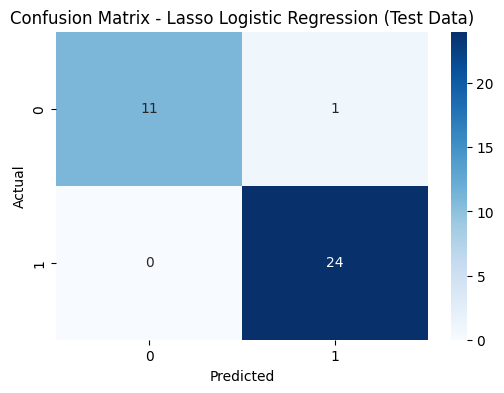


Classification Report on Test Data:
              precision    recall  f1-score   support

           0       1.00      0.92      0.96        12
           1       0.96      1.00      0.98        24

    accuracy                           0.97        36
   macro avg       0.98      0.96      0.97        36
weighted avg       0.97      0.97      0.97        36



In [ ]:
y_test_pred_class = pipe_lasso.predict(X_te)
y_test_pred_proba = pipe_lasso.predict_proba(X_te)[:, 1]

cm_test = confusion_matrix(y_te, y_pred)
test_accuracy = accuracy_score(y_te, y_pred)

print(f"Lasso Logistic Regression Test Accuracy: {test_accuracy:.4f}")
print("Confusion Matrix on Test Data:")
print(cm_test)

plt.figure(figsize=(6, 4))
sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix - Lasso Logistic Regression (Test Data)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

print("\nClassification Report on Test Data:")
print(classification_report(y_test, y_test_pred_class))

In [ ]:
scaler = pipe_lasso.named_steps['scaler']
model = pipe_lasso.named_steps['clf']
unscaled_coefficients = model.coef_[0] / scaler.scale_
unscaled_intercept = model.intercept_ - np.sum((scaler.mean_ / scaler.scale_) * model.coef_[0])
unscaled_coefficients_series = pd.Series(unscaled_coefficients, index=X.columns)

non_zero_coefficients = unscaled_coefficients_series[unscaled_coefficients_series != 0]
print("Ненулевые коэффициенты в исходных единицах:")
print(non_zero_coefficients)

print("Свободный член (intercept):", float(unscaled_intercept))

Ненулевые коэффициенты в исходных единицах:
Возраст     -0.105648
О.ж.,%       0.108396
Висц.ж,%     0.479045
Мыш.м,%     -0.034940
СООВ,ккал   -0.000315
ОГ,см       -0.104806
ОБ,см       -0.003571
ИМТ          0.341212
АЛТ          0.161180
АСТ          1.962580
ГГТП         1.716419
ЩФ           2.711826
ЛПНП        -0.719426
Триглиц.     0.326932
Билир.о     -0.790900
Билир.пр     0.238578
Глюкоза      0.611475
Ферритин    -0.248886
СРБ         -0.167163
О.белок     -0.066787
Моч.к-та     0.002668
dtype: float64
Свободный член (intercept): -25.478513844976767


/tmp/ipython-input-1118348276.py:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print("Свободный член (intercept):", float(unscaled_intercept))


## **Elastic Net**

In [ ]:
X = combined_df[features]
y = combined_df['Group']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

log_reg_elastic = LogisticRegression(penalty='elasticnet', solver='saga', l1_ratio=0.5, max_iter=10000,)  # Elastic Net
rfe = RFE(estimator=log_reg_elastic, n_features_to_select=10)
rfe.fit(X_train_scaled, y_train)

selected_features = X.columns[rfe.support_]
print(f"Выбранные признаки: {selected_features}")

X_train_selected = rfe.transform(X_train_scaled)
X_test_selected = rfe.transform(X_test_scaled)

log_reg_elastic.fit(X_train_selected, y_train)

y_test_pred_class = log_reg_elastic.predict(X_test_selected)
y_test_pred_proba = log_reg_elastic.predict_proba(X_test_selected)[:, 1]

Выбранные признаки: Index(['О.ж.,%', 'Висц.ж,%', 'ОГ,см', 'ОЖ,см', 'ИМТ', 'АЛТ', 'АСТ', 'ГГТП',
       'ЛПНП', 'Ферритин'],
      dtype='object')


Elastic Net Logistic Regression Test Accuracy: 0.9444
Confusion Matrix on Test Data:
[[10  2]
 [ 0 24]]


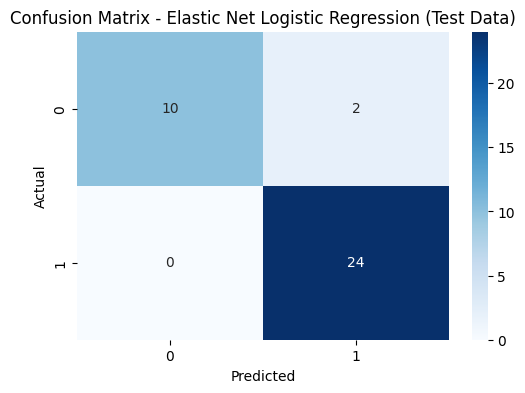


Classification Report on Test Data:
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.92      1.00      0.96        24

    accuracy                           0.94        36
   macro avg       0.96      0.92      0.93        36
weighted avg       0.95      0.94      0.94        36



In [ ]:
cm_test = confusion_matrix(y_test, y_test_pred_class)
test_accuracy = accuracy_score(y_test, y_test_pred_class)

print(f"Elastic Net Logistic Regression Test Accuracy: {test_accuracy:.4f}")
print("Confusion Matrix on Test Data:")
print(cm_test)

plt.figure(figsize=(6, 4))
sns.heatmap(cm_test, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix - Elastic Net Logistic Regression (Test Data)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

print("\nClassification Report on Test Data:")
print(classification_report(y_test, y_test_pred_class))

In [ ]:
unscaled_coefficients = log_reg_elastic.coef_[0] / scaler.scale_[rfe.support_]

unscaled_intercept = log_reg_elastic.intercept_ - np.sum((scaler.mean_[rfe.support_] / scaler.scale_[rfe.support_]) * log_reg_elastic.coef_[0])
unscaled_coefficients_series = pd.Series(unscaled_coefficients, index=selected_features)

non_zero_coefficients = unscaled_coefficients_series[unscaled_coefficients_series != 0]
print("Non-Zero Unscaled Coefficients:")
print(non_zero_coefficients)

print("Unscaled Intercept:", unscaled_intercept)

def predict_with_unscaled(features):
    y_pred = unscaled_intercept.item()
    for feature, coef in zip(selected_features, unscaled_coefficients):
        y_pred += coef * features[feature]
    return y_pred

raw_predictions = combined_df[selected_features].apply(predict_with_unscaled, axis=1)
predicted_probabilities = 1 / (1 + np.exp(-raw_predictions.to_numpy().flatten()))
predicted_classes = (predicted_probabilities >= 0.5).astype(int)

results_df = pd.DataFrame({
    'raw_prediction': raw_predictions,
    'predicted_probability': predicted_probabilities,
    'predicted_class': predicted_classes,
    'actual_class': combined_df['Group']
})

print(results_df.head())

cm = confusion_matrix(results_df['actual_class'], results_df['predicted_class'])
print("Confusion Matrix:")
print(cm)

accuracy = accuracy_score(results_df['actual_class'], results_df['predicted_class'])
print(f"Accuracy: {accuracy:.4f}")

report = classification_report(results_df['actual_class'], results_df['predicted_class'])
print("Classification Report:")
print(report)


Non-Zero Unscaled Coefficients:
О.ж.,%      0.139842
Висц.ж,%    0.272339
ОГ,см      -0.097772
ОЖ,см       0.050943
ИМТ         0.281929
АЛТ         0.087240
АСТ         2.481534
ГГТП        2.858857
ЛПНП       -0.713064
Ферритин   -0.687700
dtype: float64
Unscaled Intercept: [-24.80253824]
   raw_prediction  predicted_probability  predicted_class  actual_class
0        2.366264               0.914218                1             1
1        1.706471               0.846378                1             1
2        7.384779               0.999380                1             1
3        3.804122               0.978207                1             1
4       12.623685               0.999997                1             1
Confusion Matrix:
[[ 55   5]
 [  3 117]]
Accuracy: 0.9556
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.92      0.93        60
           1       0.96      0.97      0.97       120

    accuracy                   

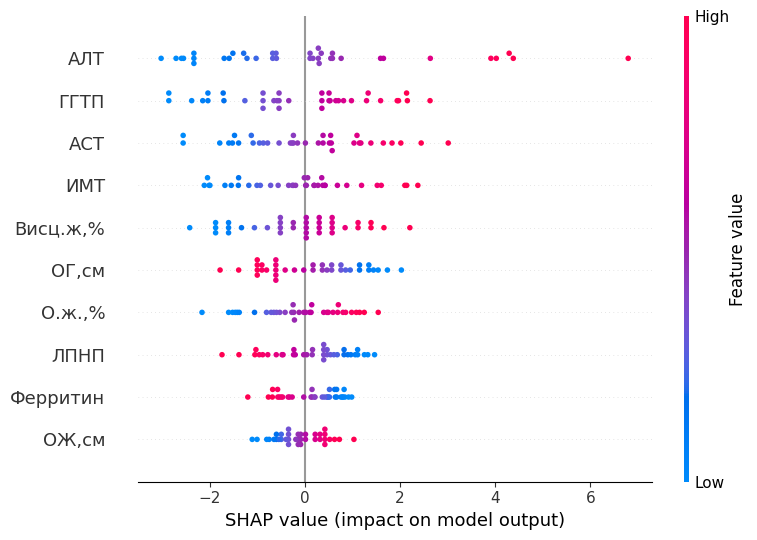

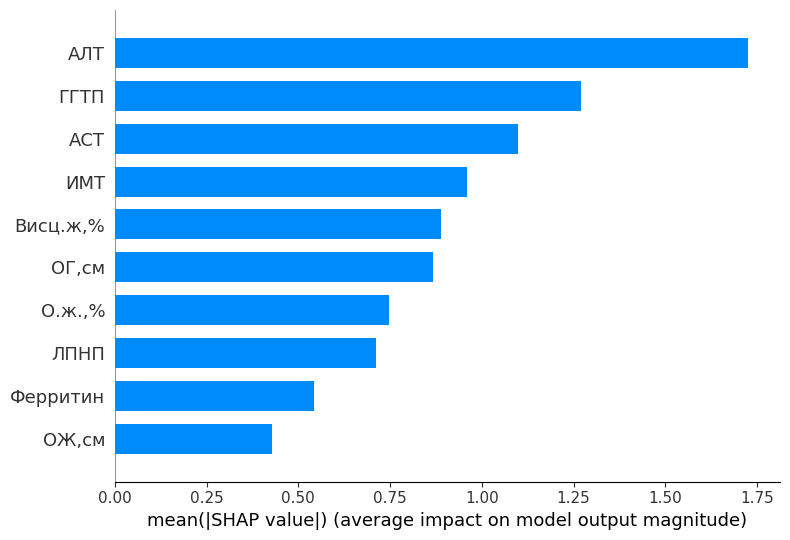

In [ ]:
selected_features = X.columns[rfe.support_]

explainer = shap.LinearExplainer(log_reg_elastic, X_train_scaled[:, rfe.support_])
shap_values = explainer.shap_values(X_test_scaled[:, rfe.support_])

sample_index = 0
shap.force_plot(explainer.expected_value, shap_values[sample_index], X_test.iloc[sample_index, :][selected_features])

shap.summary_plot(shap_values, X_test[selected_features], feature_names=selected_features)

shap.summary_plot(shap_values, X_test[selected_features], plot_type="bar", feature_names=selected_features)

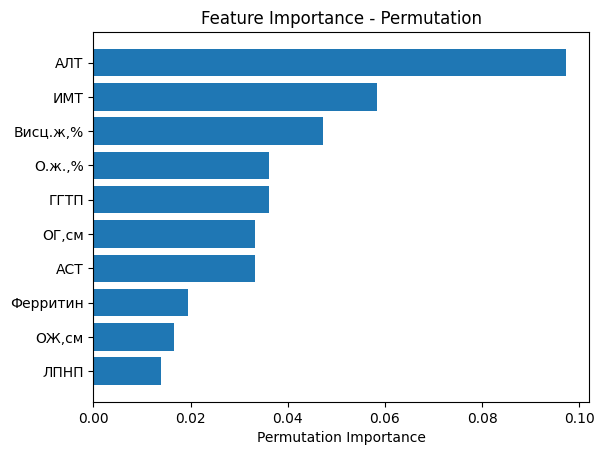

In [ ]:
perm_importance = permutation_importance(log_reg_elastic, X_test_selected, y_test, n_repeats=10, random_state=42)

sorted_idx = perm_importance.importances_mean.argsort()
plt.barh(selected_features[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Permutation Importance")
plt.title("Feature Importance - Permutation")
plt.show()


Коэффициент для ЛПНП (Липопротеины низкой плотности) отрицательный и очень высокий (-0.657441). Этот необычно высокий отрицательный коэффициент может говорить о том, что модель уделяет слишком много внимания ЛПНП, что может привести к плохой обобщаемости.

Интерсепт модели (-14.9727167) большой и отрицательный, что говорит о смещении модели.

Эти коэффициенты показывают, что Elastic Net некорректно отображает взаимосвязи между признаками для предсказания НАЖБП. Несмотря на хорошие показатели на обучающей выборке, значения коэффициентов и большой интерсепт указывают на то, что Elastic Net может быть не лучшим выбором для данной задачи.

## **Explainable Boosting Machine**

In [ ]:
def min_max_scaler(data, feature_min, feature_max):
    return (data - feature_min) / (feature_max - feature_min)

In [ ]:
features

['Пол',
 'Возраст',
 'О.ж.,%',
 'Висц.ж,%',
 'Кости,кг',
 'Вода,%',
 'СООВ,ккал',
 'ОГ,см',
 'ОТ,см',
 'ОЖ,см',
 'ОБ,см',
 'ИМТ',
 'АЛТ',
 'АСТ',
 'ГГТП',
 'ЩФ',
 'ХСобщ.',
 'ЛПНП',
 'ЛПВП',
 'Триглиц.',
 'Билир.о',
 'Билир.пр',
 'Глюкоза',
 'Инсулин',
 'Ферритин',
 'СРБ',
 'О.белок',
 'Моч.к-та']

In [ ]:
X = combined_df[features]
y = combined_df['Group']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)
# X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X.columns)
# X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X.columns)

feature_min = X_train.min()
feature_max = X_train.max()

X_train_scaled = min_max_scaler(X_train, feature_min, feature_max)
X_test_scaled = min_max_scaler(X_test, feature_min, feature_max)

X_train_scaled_df = pd.DataFrame(X_train, columns=X.columns)
X_test_scaled_df = pd.DataFrame(X_test, columns=X.columns)


ebm = ExplainableBoostingClassifier()
ebm.fit(X_train_scaled_df, y_train)

y_test_pred_class = ebm.predict(X_test)



In [ ]:
print("Classification Report:")
print(classification_report(y_test, y_test_pred_class))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_test_pred_class))

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.92      1.00      0.96        24

    accuracy                           0.94        36
   macro avg       0.96      0.92      0.93        36
weighted avg       0.95      0.94      0.94        36

Confusion Matrix:
[[10  2]
 [ 0 24]]


In [ ]:
ebm_global = ebm.explain_global()
show(ebm_global)

In [ ]:
contributions = []
intercept = ebm.intercept_[0]

for i, feature_name in enumerate(X_train_scaled_df.columns):
    feature_contrib = ebm_global.data(i)['scores']
    contributions.append(feature_contrib)
print(intercept)

5.119367278753534


In [ ]:
ebm_local = ebm.explain_local(X_test[:10], y_test[:10])
show(ebm_local)

### **Без Масштабирования**

In [ ]:
X = combined_df[features]
y = combined_df['Group']

# Разбиваем выборку
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Обучаем Explainable Boosting Machine на «сырых» данных
ebm = ExplainableBoostingClassifier()
ebm.fit(X_train, y_train)

# Делаем предсказания на тестовой выборке
y_pred = ebm.predict(X_test)

# Оцениваем качество
print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.92      1.00      0.96        24

    accuracy                           0.94        36
   macro avg       0.96      0.92      0.93        36
weighted avg       0.95      0.94      0.94        36

Confusion Matrix:
[[10  2]
 [ 0 24]]


In [ ]:
ebm_global = ebm.explain_global()
show(ebm_global)

In [ ]:
ebm_local = ebm.explain_local(X_test[:10], y_test[:10])
show(ebm_local)

### **С балансировкой весов**


In [ ]:
from sklearn.utils import compute_sample_weight

X = combined_df[features]
y = combined_df['Group']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

weights = compute_sample_weight(class_weight='balanced', y=y_train)

ebm = ExplainableBoostingClassifier()
ebm.fit(X_train, y_train, sample_weight=weights)

print("Intercept after balancing:", ebm.intercept_[0])


Intercept after balancing: 1.2047802079382466


In [ ]:
y_pred = ebm.predict(X_test)
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))


Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.92      1.00      0.96        24

    accuracy                           0.94        36
   macro avg       0.96      0.92      0.93        36
weighted avg       0.95      0.94      0.94        36

Confusion Matrix:
[[10  2]
 [ 0 24]]


In [ ]:
ebm_local = ebm.explain_local(X_test[:10], y_test[:10])
show(ebm_local)

## **CalibratedClassifierCV**


Чтобы смягчить чрезмерную уверенность (prob≈0 или prob≈1), вариант — откалибровать вероятности модели.

In [ ]:
X = combined_df[features]
y = combined_df['Group']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

base_ebm = ExplainableBoostingClassifier(random_state=42)

calib_clf = CalibratedClassifierCV(
    estimator=base_ebm,
    method='sigmoid',
    cv=5,
    ensemble=True
)
calib_clf.fit(X_train, y_train)

proba = calib_clf.predict_proba(X_test)[:, 1]
print("Мин/макс вероятностей после sigmoid:", proba.min(), proba.max())

y_pred = calib_clf.predict(X_test)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


Мин/макс вероятностей после sigmoid: 0.018468163280697798 0.9736350908087766
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.92      1.00      0.96        24

    accuracy                           0.94        36
   macro avg       0.96      0.92      0.93        36
weighted avg       0.95      0.94      0.94        36

[[10  2]
 [ 0 24]]


### **Настройка EBM-гиперпараметров**
EBM - бустинг над бинами; если бинов слишком много или допускаются «тонкие» листы, модель легко найдёт участки с чистой выборкой и выдаст там 0/1
<br>Чтобы этого не было, ограничим сложность

In [ ]:
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingRandomSearchCV, RandomizedSearchCV

In [ ]:
X = combined_df[features]
y = combined_df['Group']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

ebm = ExplainableBoostingClassifier(
    random_state=42,
    interactions=0,
    n_jobs=-1
)

param_dist = {
    "max_bins": [10, 20, 50],
    "min_samples_leaf": [5, 10, 20],
    "learning_rate": loguniform(1e-2, 1e-1),
    "max_rounds": [50, 100, 200],
    "greedy_ratio": [0, 1, 5],
}

cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)


rand = RandomizedSearchCV(
    estimator=ebm,
    param_distributions=param_dist,
    n_iter=40,
    scoring="roc_auc",
    cv=cv,
    random_state=42,
    n_jobs=-1,
    verbose=1,
)
rand.fit(X_train, y_train)
best_ebm = rand.best_estimator_

print("\nClassification Report (best):")
print(classification_report(y_test, best_ebm.predict(X_test)))
print("Confusion Matrix (best):\n", confusion_matrix(y_test, best_ebm.predict(X_test)))


Fitting 3 folds for each of 40 candidates, totalling 120 fits

Classification Report (best):
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.92      1.00      0.96        24

    accuracy                           0.94        36
   macro avg       0.96      0.92      0.93        36
weighted avg       0.95      0.94      0.94        36

Confusion Matrix (best):
 [[10  2]
 [ 0 24]]


## Web App

In [ ]:
!pip install streamlit ngrok

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 57.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 70.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 77.3 MB/s eta 0:00:00


In [ ]:
!pip install pyngrok

In [ ]:
!ps -ef | grep streamlit

root        2737     777  0 13:30 ?        00:00:00 /bin/bash -c ps -ef | grep streamlit
root        2739    2737  0 13:30 ?        00:00:00 grep streamlit


In [ ]:
!streamlit run health_prediction_app.py --server.port 8501 &>/dev/null&

In [ ]:
with open('health_prediction_app.py', 'w') as f:
    f.write("""
import streamlit as st
import numpy as np
import matplotlib.pyplot as plt

unscaled_coefficients = {
    'Возраст': -0.052959,
    'Висц.ж,%': 0.408395,
    'Мыш.м,%': -0.169631,
    'ИМТ': 0.178240,
    'АЛТ': 0.119727,
    'АСТ': 0.060623,
    'ГГТП': 0.090496,
    'ЛПНП': -0.550825,
    'Ферритин': -0.005117,
    'О.белок': -0.107443
}

unscaled_intercept = 5.67207853

def predict_probability_and_class(features, threshold=0.5):
    y_pred = unscaled_intercept
    for feature, coef in unscaled_coefficients.items():
        y_pred += coef * features.get(feature, 0)
    probability = 1 / (1 + np.exp(-y_pred))
    predicted_class = "Болен" if probability >= threshold else "Здоров"
    return probability, predicted_class

st.set_page_config(page_title="Прогноз НАЖБП", page_icon="💉", layout="wide")

st.title("💉 Прогноз НАЖБП")
st.write("Введите значения показателей для получения прогноза вероятности НАЖБП.")

gender = st.radio("**Выберите пол:**", ("Мужской", "Женский"))

if gender == "Мужской":
    normal_ranges = {
        'Возраст': (0, 100),
        'Висц.ж,%': (1, 10),
        'Мыш.м,%': (40, 50),
        'ИМТ': (18.5, 24.9),
        'АЛТ': (7, 42),
        'АСТ': (7, 42),
        'ГГТП': (9, 40),
        'ЛПНП': (2, 5),
        'Ферритин': (20, 250),
        'О.белок': (60, 85)
    }
else:
    normal_ranges = {
        'Возраст': (0, 100),
        'Висц.ж,%': (1, 10),
        'Мыш.м,%': (30, 40),
        'ИМТ': (18.5, 24.9),
        'АЛТ': (7, 42),
        'АСТ': (7, 42),
        'ГГТП': (9, 32),
        'ЛПНП': (1.9, 4.6),
        'Ферритин': (10, 130),
        'О.белок': (60, 85)
    }

col1, col2 = st.columns(2)

with col1:
    st.header("**Введите показатели:**")
    age = st.number_input("**Возраст**", min_value=0, max_value=100, value=30)
    vis_fat = st.number_input("**Висц.ж,%**", min_value=0.0, max_value=100.0, value=5.0)
    muscle_mass = st.number_input("**Мыш.м,%**", min_value=0.0, max_value=100.0, value=30.0)
    bmi = st.number_input("**ИМТ**", min_value=0.0, max_value=100.0, value=24.0)
    alt = st.number_input("**АЛТ**", min_value=0.0, max_value=200.0, value=30.0)
    ast = st.number_input("**АСТ**", min_value=0.0, max_value=200.0, value=30.0)
    ggtp = st.number_input("**ГГТП**", min_value=0.0, max_value=200.0, value=15.0)
    ldl = st.number_input("**ЛПНП**", min_value=0.0, max_value=10.0, value=3.0)
    ferritin = st.number_input("**Ферритин**", min_value=0.0, max_value=1000.0, value=50.0)
    total_protein = st.number_input("**О.белок**", min_value=0.0, max_value=100.0, value=70.0)

with col2:
    if st.button("Рассчитать Прогноз"):
        input_features = {
            'Возраст': age,
            'Висц.ж,%': vis_fat,
            'Мыш.м,%': muscle_mass,
            'ИМТ': bmi,
            'АЛТ': alt,
            'АСТ': ast,
            'ГГТП': ggtp,
            'ЛПНП': ldl,
            'Ферритин': ferritin,
            'О.белок': total_protein
        }
        probability, predicted_class = predict_probability_and_class(input_features)

        st.subheader("**Результаты Прогноза:**")
        st.write(f"**Вероятность:** {probability:.4f}")
        st.write(f"**Класс:** {predicted_class}")

        if predicted_class == "Болен":
            st.error("Модель предсказывает, что вы больны.")
        else:
            st.success("Модель предсказывает, что вы здоровы.")

        st.subheader("**Сравнение введенных значений с нормальными диапазонами**")
        fig, ax = plt.subplots(figsize=(8, 5))
        features = ['Возраст', 'Висц.ж,%', 'Мыш.м,%', 'ИМТ', 'АЛТ', 'АСТ', 'ГГТП', 'ЛПНП', 'Ферритин', 'О.белок']
        user_values = [age, vis_fat, muscle_mass, bmi, alt, ast, ggtp, ldl, ferritin, total_protein]
        normal_min = [normal_ranges[feat][0] for feat in features]
        normal_max = [normal_ranges[feat][1] for feat in features]

        for i, (min_val, max_val) in enumerate(zip(normal_min, normal_max)):
            ax.plot([min_val, max_val], [i, i], color='gray', lw=6, alpha=0.5, label='Нормальный диапазон' if i == 0 else "")

        ax.scatter(user_values, range(len(features)), color='blue', s=100, zorder=5, label='Ваши значения')

        ax.set_xlabel('Значения', fontsize=12, fontweight='bold')
        ax.set_title('Сравнение показателей с нормальными диапазонами', fontsize=14, fontweight='bold')

        ax.set_yticks(range(len(features)))
        ax.set_yticklabels(features, fontsize=11, fontweight='bold')
        ax.tick_params(axis='x', labelsize=10)
        ax.xaxis.label.set_size(12)

        ax.spines['right'].set_visible(False)
        ax.spines['top'].set_visible(False)

        ax.spines['left'].set_linewidth(1.5)
        ax.spines['bottom'].set_linewidth(1.5)

        ax.grid(True, axis='x', linestyle='--', alpha=0.6)

        ax.legend(loc='lower right', fontsize=10)

        st.pyplot(fig)

st.write("---")
st.write("Это приложение создано для помощи в прогнозе НАЖБП на основе различных показателей.")
st.write("Приложение использует биохимические маркеры, индекс массы тела, и другие параметры.")
st.write("Приложение НЕ создано для самостоятельной постановки диагноза.")

    """)

In [ ]:
from pyngrok import ngrok

ngrok.set_auth_token('***')
#2kBZ0My2aTS2A5YxsNl0Ak31Foz_6Cw12VVU49uDn7GSGZDdZ

public_url = ngrok.connect(8501)
print(f"Public URL: {public_url}")

Public URL: NgrokTunnel: "https://e6b2b705cd8e.ngrok-free.app" -> "http://localhost:8501"
